# Importing libraries

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

from matplotlib import cm
import matplotlib.colors

from matplotlib import animation, rc
from IPython.display import HTML

import numpy as np
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

# Creating Toy Dataset

In [ ]:
X = np.array([-2,-1.5,-1,1,1.5,2]) #feature values
Y = np.array([0,0,0,1,1,1]) #true labels
m = X.shape[0] #length of dataset

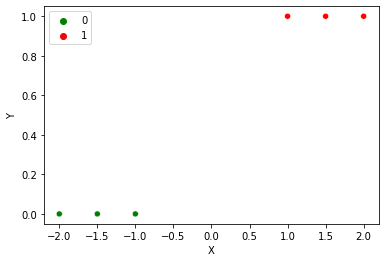

In [ ]:
# visualizing the dataset
sns.scatterplot(X,Y,hue=Y,palette=['green','red'])
plt.xlabel('X')
plt.ylabel('Y')
plt.show()

# Creating Logistic Regression(Sigmoid) Model Class

# $\hat{y}=\frac{1}{1 + e^{-(wx+b)}}$<br>
# $L=\frac{1}{2m}\sum_{i=1}^{m}\left (\hat{y_{i}}-y_{i} \right )^{2}
$

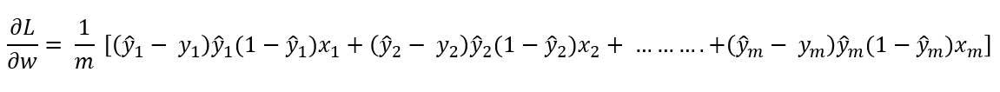

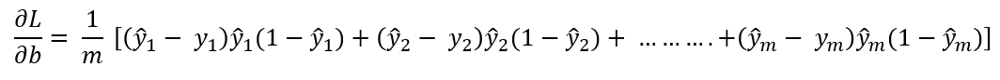

In [ ]:
class LR:
    def __init__(self, w_init=0, b_init=0):
        self.w = w_init
        self.b = b_init
        
    def sigmoid(self, x,w=None,b=None):
        if w is None:
            w = self.w
        if b is None:
            b = self.b
        return (1/(1 + np.exp(-(w*x + b))))
    def error(self, X, Y, w=None, b=None):
        if w is None:
            w = self.w
        if b is None:
            b = self.b
        err = 0
        for x, y in zip(X, Y):
            err += 0.5 * (self.sigmoid(x, w, b) - y) ** 2
        return err/m
    def grad_w(self, x,y,w=None,b=None):
        if w is None:
            w = self.w
        if b is None:
            b = self.b
        y_pred = self.sigmoid(x,w,b)
        return (y_pred - y)*y_pred*(1 - y_pred)*x
    def grad_b(self, x,y,w=None,b=None):
        if w is None:
            w = self.w
        if b is None:
            b = self.b
        y_pred = self.sigmoid(x,w,b)
        return (y_pred - y)*y_pred*(1 - y_pred)
    def fit(self, X,Y,epochs = 100, lr = 0.5): #training
        self.w_hist = []
        self.b_hist = []
        self.loss_hist=[]
        self.X = X
        self.Y = Y
        m = X.shape[0]
        #storing initial values of w,b,loss
        self.w_hist.append(self.w)
        self.b_hist.append(self.b)
        self.loss_hist.append(self.error(self.X, self.Y))
        for i in range(epochs): #training loop
            dw, db = 0,0
            for x,y in zip(X,Y): #for each row in the dataset
                #accumulating gradients
                dw+=self.grad_w(x,y)
                db+=self.grad_b(x,y)
            dw = dw/m
            db = db/m
            #gradient descent update rule
            self.w = self.w - lr*dw
            self.b = self.b - lr*db
            #storing updated w,b,loss
            self.w_hist.append(self.w)
            self.b_hist.append(self.b)
            self.loss_hist.append(self.error(self.X, self.Y))

In [ ]:
w_init, b_init = -2,1 #initializing values of w,b
epochs = 50
lr = 0.8 #learning rate

In [ ]:
model = LR(w_init, b_init) #initializing the model

In [ ]:
model.fit(X,Y,epochs,lr) #training

In [ ]:
#making predictions
model.sigmoid(np.array([-2.5,1.2,2.6]))

array([0.04637701, 0.91247357, 0.98757122])

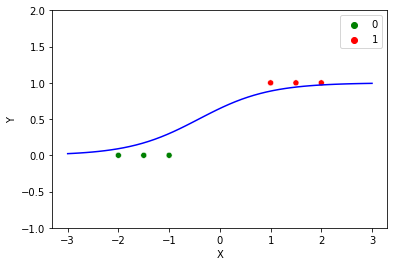

In [ ]:
#visualizing the model after training
sns.scatterplot(X,Y,hue=Y,palette=['green','red'])
X_ = np.linspace(min(X)-1,max(X)+1,50)
plt.plot(X_,model.sigmoid(X_),c='blue')
plt.xlabel('X')
plt.ylabel('Y')
plt.ylim((min(Y)-1,max(Y)+1))
plt.show()

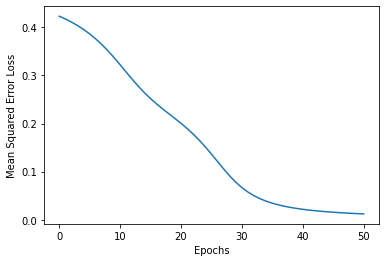

In [ ]:
#loss vs epochs graph
plt.plot(model.loss_hist)
plt.xlabel('Epochs')
plt.ylabel('Mean Squared Error Loss')
plt.show()

# Animation of Model during Training

In [ ]:
y_pred_hist=[]
X_ = np.linspace(min(X)-1,max(X)+1,50)
for i in range(len(model.w_hist)):
  y_pred_hist.append(model.sigmoid(X_,model.w_hist[i],model.b_hist[i]))
y_hist=np.array(y_pred_hist).reshape(epochs+1,X_.shape[0])

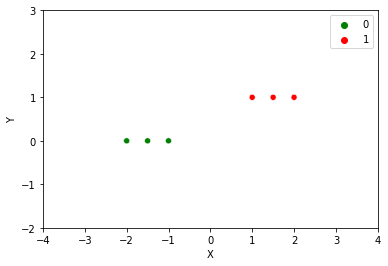

In [ ]:
fig, ax = plt.subplots()

ax.set_xlim((min(X)-2, max(X)+2))
ax.set_ylim((min(Y)-2, max(Y)+2))
sns.scatterplot(X,Y,hue=Y,palette=['green','red'])
plt.xlabel('X')
plt.ylabel('Y')
line, = ax.plot([], [], lw=2,color='blue')

In [ ]:
def animate(i):
    x = X_
    y = y_hist[i,:]
    line.set_data(x, y)
    return (line,)

In [ ]:
anim = animation.FuncAnimation(fig, animate, 
                               frames=epochs+1, interval=500, 
                               blit=True)

In [ ]:
HTML(anim.to_jshtml())

# Visualizing the Loss surface

In [ ]:
#creating the 2d space for w and b axis
w_min,w_max=-5,5 
b_min,b_max=-5,5 

plot_3d = True  #set True For 3d error surface
plot_2d = False   #set True For 2d contour
#note: only one thing can be set True at a time
animation_frames=epochs+1 #number of frames in the animation

In [ ]:
def plot_animate_3d(i):
  i = int(i*((epochs+1)/animation_frames))
  line1.set_data(model.w_hist[:i+1], model.b_hist[:i+1])
  line1.set_3d_properties(model.loss_hist[:i+1])
  line2.set_data(model.w_hist[:i+1], model.b_hist[:i+1])
  line2.set_3d_properties(np.zeros(i+1) - 1)
  title.set_text('Epoch: {: d}, Error: {:.4f}'.format(i, model.loss_hist[i]))
  return line1, line2, title

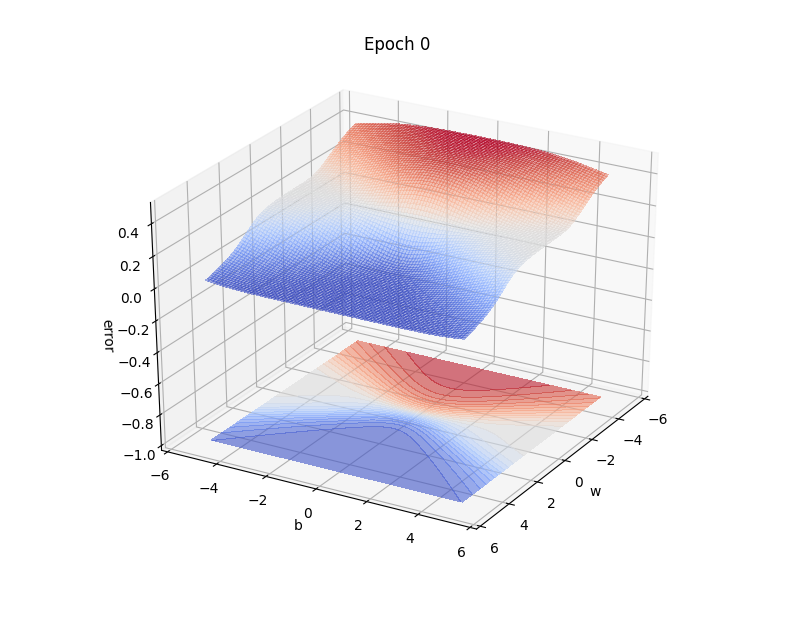

In [ ]:
if plot_3d: 
  W = np.linspace(w_min, w_max, 256)
  b = np.linspace(b_min, b_max, 256)
  WW, BB = np.meshgrid(W, b)
  Z = model.error(X, Y, WW, BB)
  fig = plt.figure(dpi=100, figsize=(10,8))
  ax = fig.gca(projection='3d')
  surf = ax.plot_surface(WW, BB, Z, rstride=3, cstride=3, alpha=0.5, cmap=cm.coolwarm, linewidth=0, antialiased=False)
  cset = ax.contourf(WW, BB, Z, 25, zdir='z', offset=-1, alpha=0.6, cmap=cm.coolwarm)
  ax.set_xlabel('w')
  ax.set_xlim(w_min - 1, w_max + 1)
  ax.set_ylabel('b')
  ax.set_ylim(b_min - 1, b_max + 1)
  ax.set_zlabel('error')
  ax.set_zlim(-1, np.max(Z))
  ax.view_init (elev=30, azim=30) # azim = -20
  ax.dist=12  
  title = ax.set_title('Epoch 0')


In [ ]:
if plot_3d: 
  i = 0
  line1, = ax.plot(model.w_hist[:i+1], model.b_hist[:i+1], model.loss_hist[:i+1], color='black',marker='.')
  line2, = ax.plot(model.w_hist[:i+1], model.b_hist[:i+1], np.zeros(i+1) - 1, color='red', marker='.')
  anim = animation.FuncAnimation(fig, func=plot_animate_3d, frames=animation_frames)
  rc('animation', html='jshtml')
  anim

In [ ]:
if plot_2d: 
  W = np.linspace(w_min, w_max, 256)
  b = np.linspace(b_min, b_max, 256)
  WW, BB = np.meshgrid(W, b)
  Z = model.error(X, Y, WW, BB)

  fig = plt.figure(dpi=100, figsize=(8,5))
  ax = plt.subplot(111)
  ax.set_xlabel('w')
  ax.set_xlim(w_min - 1, w_max + 1)
  ax.set_ylabel('b')
  ax.set_ylim(b_min - 1, b_max + 1)
  title = ax.set_title('Epoch 0')
  cset = plt.contourf(WW, BB, Z, 25, alpha=0.6, cmap=cm.bwr)
  plt.show()

In [ ]:
def plot_animate_2d(i):
  i = int(i*((epochs+1)/animation_frames))
  line.set_data(model.w_hist[:i+1], model.b_hist[:i+1])
  title.set_text('Epoch: {: d}, Error: {:.4f}'.format(i, model.loss_hist[i]))
  return line, title

In [ ]:
if plot_2d: 
  i = 0
  line, = ax.plot(model.w_hist[:i+1], model.b_hist[:i+1], color='black',marker='.')
  anim = animation.FuncAnimation(fig, func=plot_animate_2d, frames=animation_frames)
  rc('animation', html='jshtml')
  anim

In [ ]:
anim

In [ ]:
anim.save('animation2.mp4')

In [ ]:
!pip install MoviePy

In [ ]:
import moviepy.editor as mp

clip = mp.VideoFileClip("/content/animation2.mp4")
clip.write_gif("/content/animation2.gif")

# Note: The loss surface is not convex when we use MSE Loss with Sigmoid Model